## Benchmark models

Let's compare imputation performance.

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc

warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning)

import data_support as sup
import scp.plots as pl
from scp.benchmark_models import *
import scp.benchmark_models as bm
import scp.simulations as sm
import scp.metrics as metrics

np.random.seed(0)

Let's define a few helper functions.

In [31]:
def run_imputation_method(adata, method_fn_name, method_label_name=None, **fn_kwargs):
    if method_label_name is None:
        method_label_name = method_fn_name

    # imputation
    fn = globals()[method_fn_name]
    x_est = fn(adata, layer="main", **fn_kwargs)
    adata.X = x_est

    # plotting
    x_main = adata.layers["main"]
    x_pilot = adata.layers["pilot"]

    sc.pp.neighbors(adata)
    sc.tl.umap(adata)

    sc.pl.umap(
        adata,
        color=["Preparation day", "Plate", "log Qalb", "Diagnosis_group", "Sex", "Age", "IgG CSF", "n_genes"], 
    )

    pl.plot_protein_intensity_panel(x_main, x_est, title=f"MAIN - {method_label_name}")
    sup.scatter_main_pilot_model(x_main, x_pilot, x_est, model_name=method_label_name, n_min_protein_overlap=2)
    sup.scatter_pilot_model_by_protein(x_main, x_pilot, x_est)
    sup.scatter_difference_observed_and_missing_by_protein(x_pilot, x_main, x_est)
    pl.scatter_protein_mean_and_cv(x_est)

    results = sup.compute_common_metrics(x_main, x_pilot, x_est)
    sup.save_dict_to_results(results, f"{method_label_name}.pkl")

## Data Loading

Let"s load the data.

In [32]:
adata = sc.read_h5ad("../../data/processed/manns_inhouse.h5ad")

## Pilot as ground truth

### Downshifted normal sample

         Falling back to preprocessing with `sc.pp.pca` and default params.


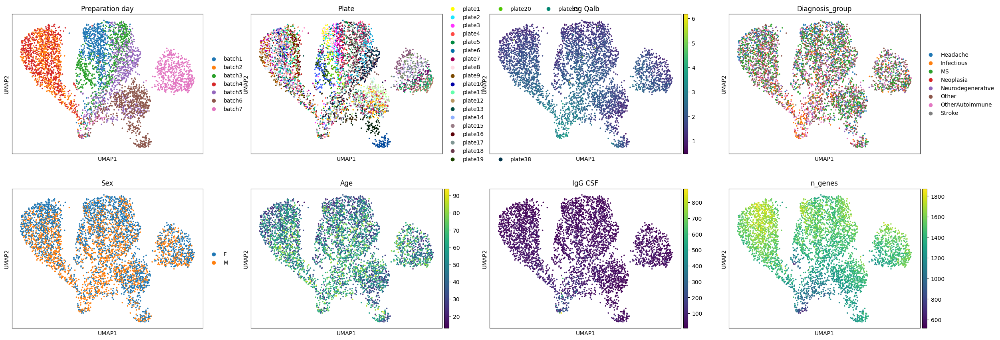

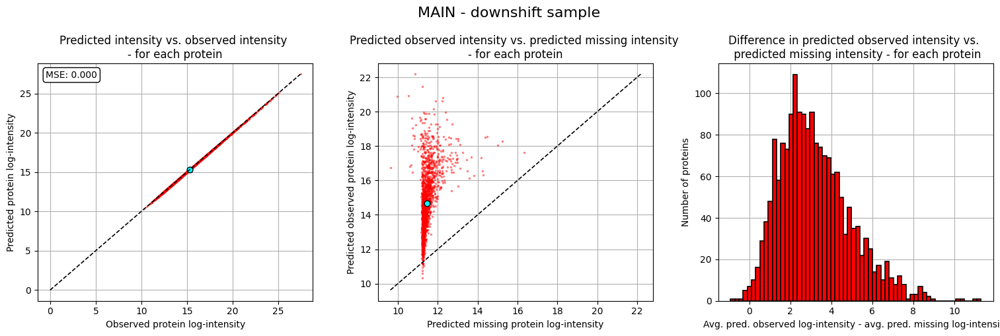

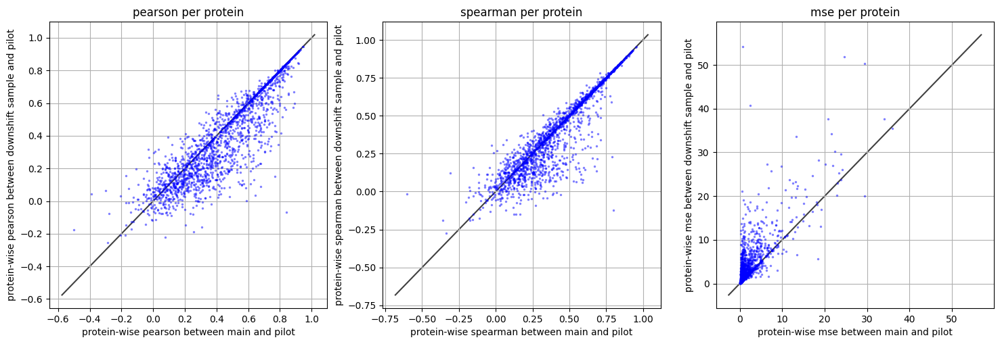

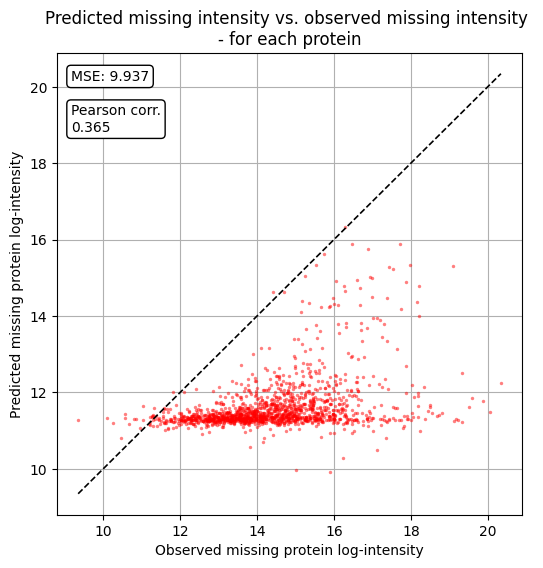

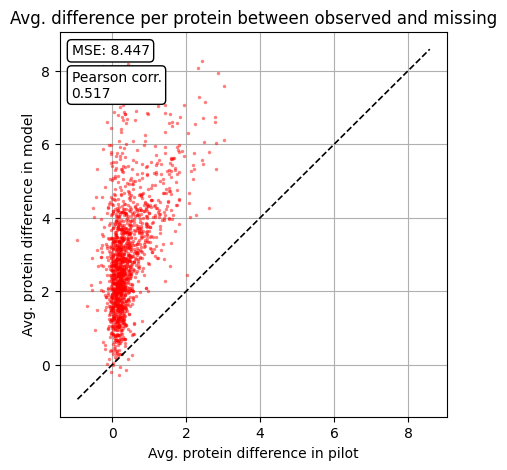

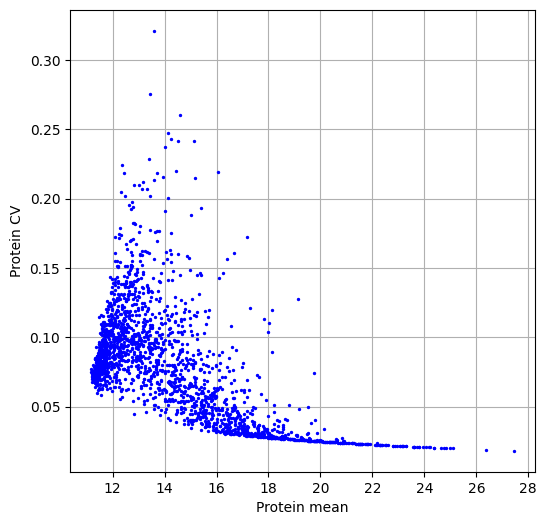

In [33]:
run_imputation_method(adata, "impute_downshifted_normal_sample", "downshift sample")

### Downshifted normal global

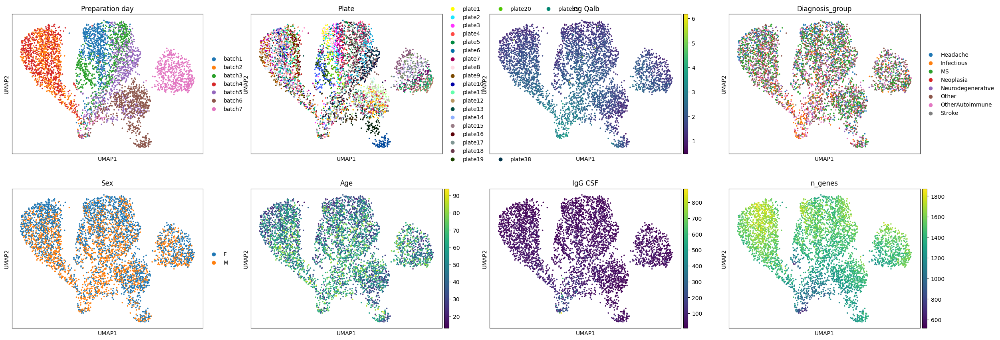

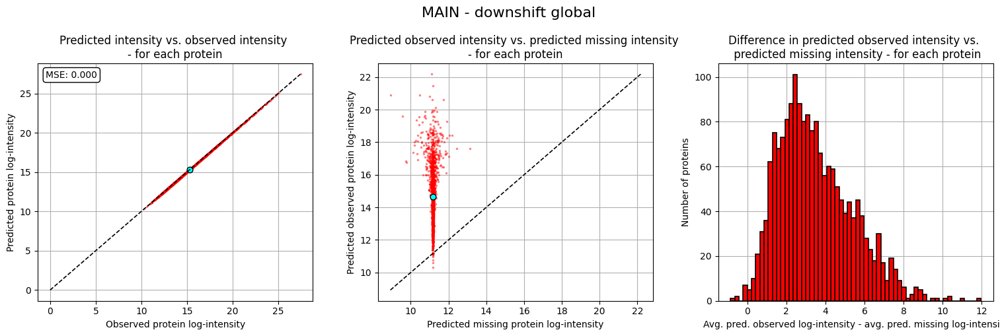

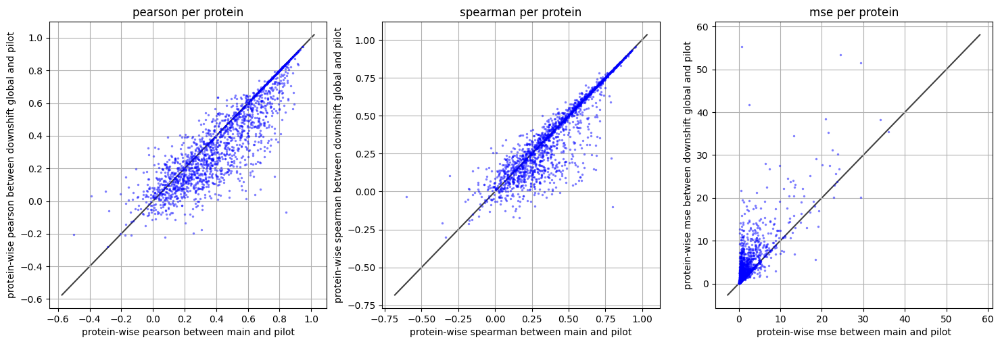

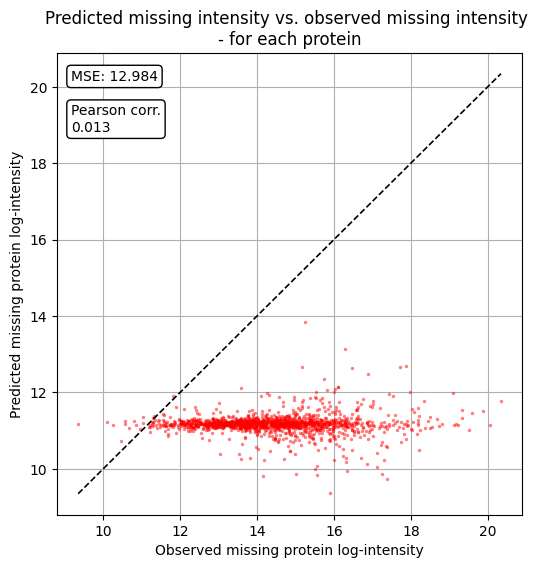

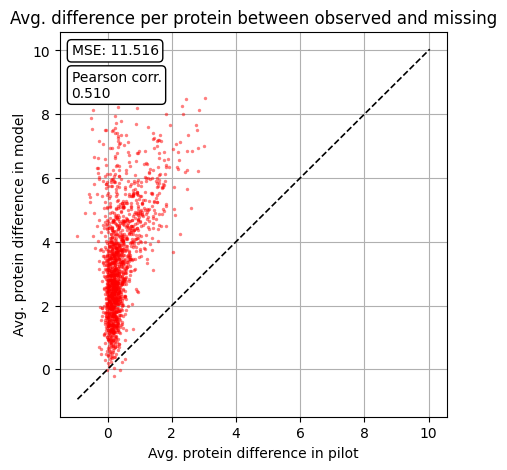

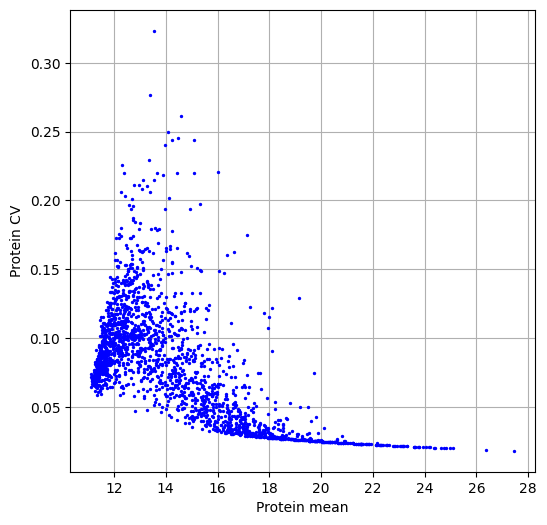

In [34]:
run_imputation_method(adata, "impute_downshifted_normal_global", "downshift global")

### Downshifted normal local

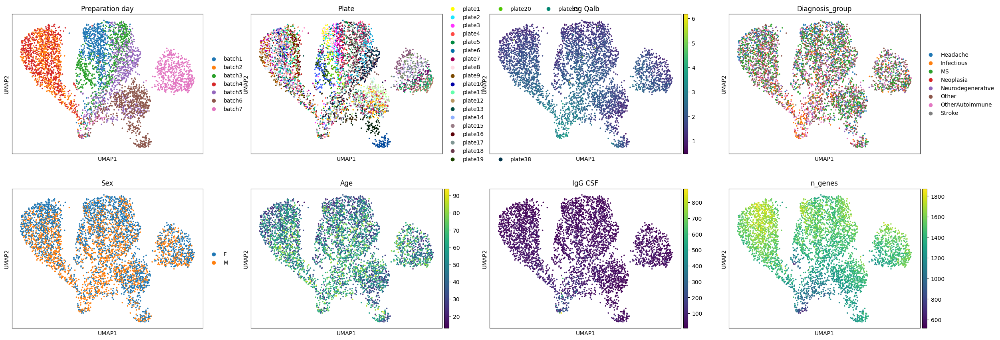

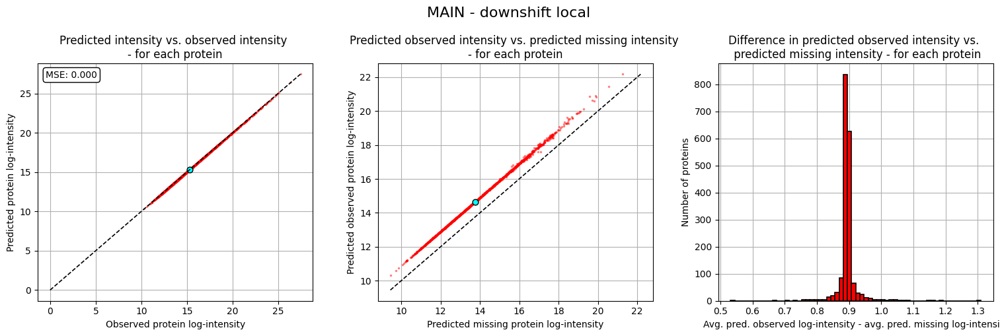

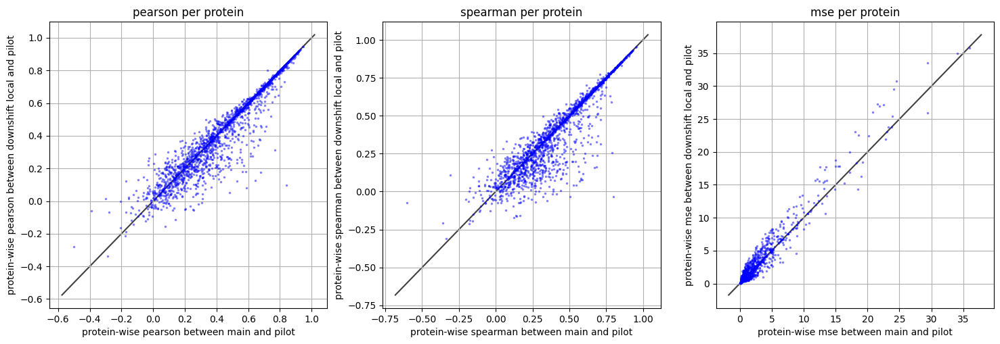

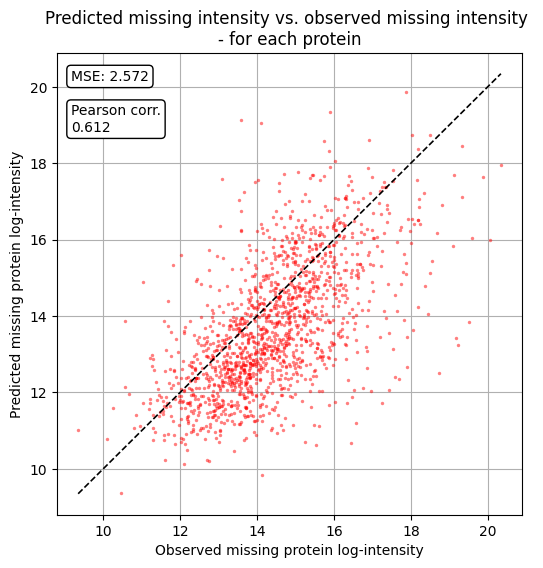

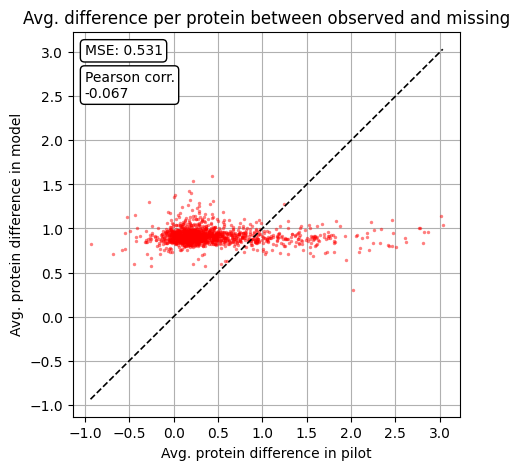

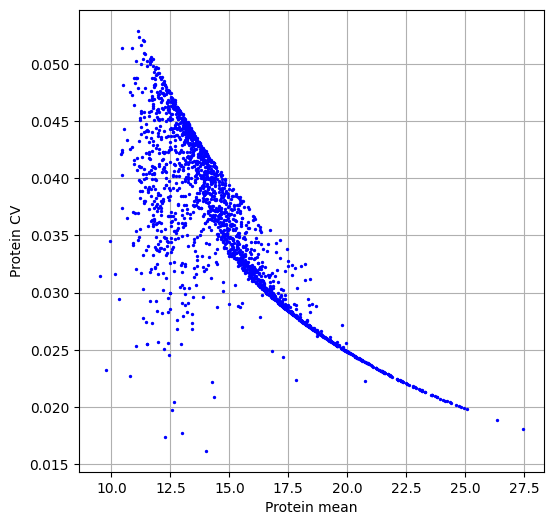

In [35]:
run_imputation_method(adata, "impute_downshifted_normal_local", "downshift local")

### Sample min

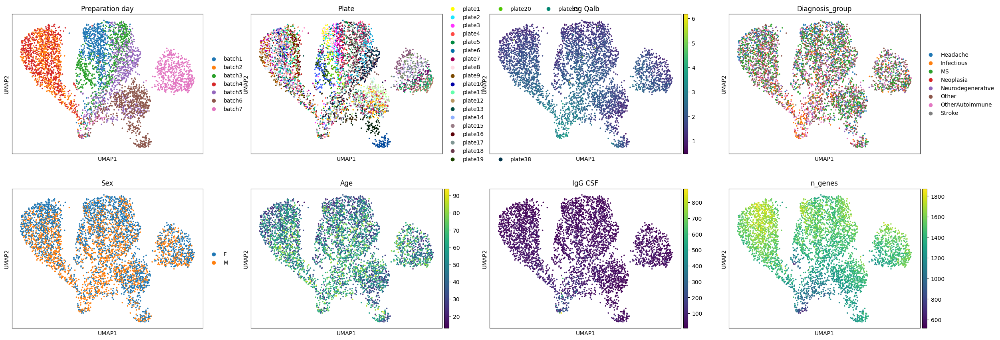

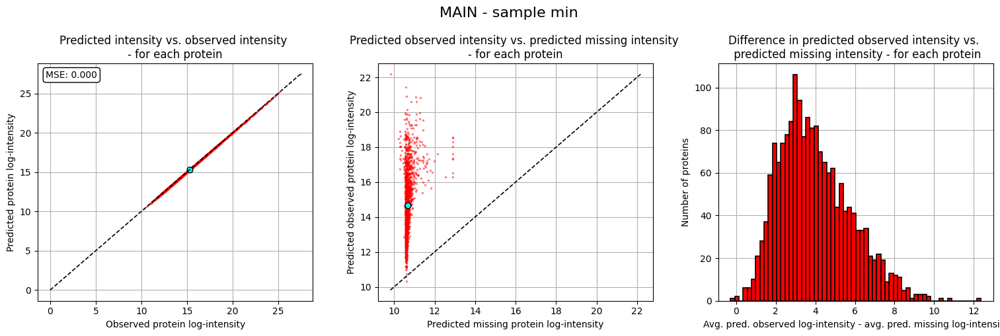

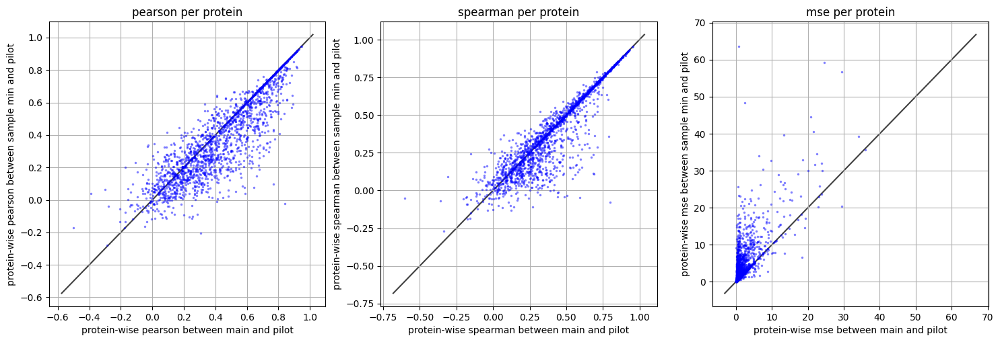

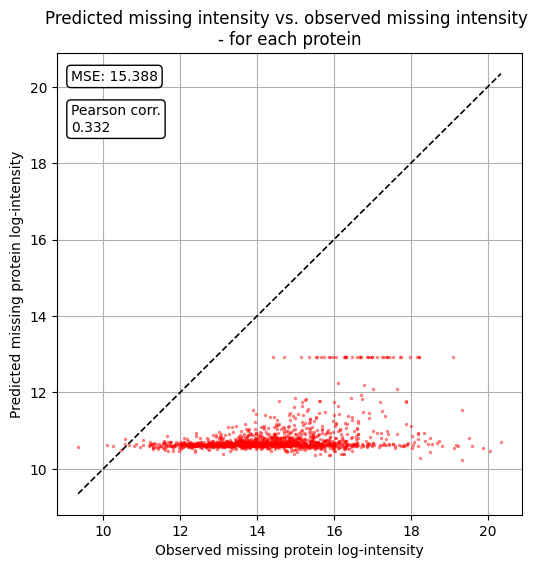

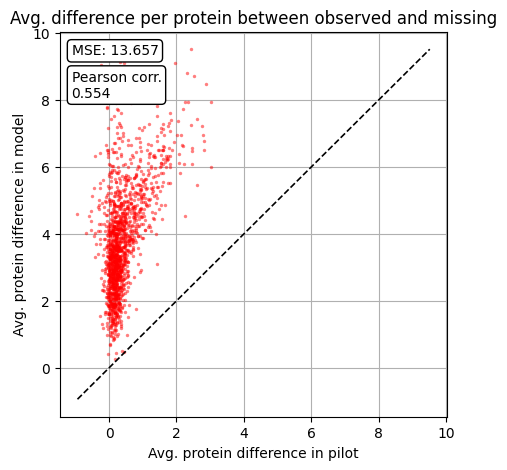

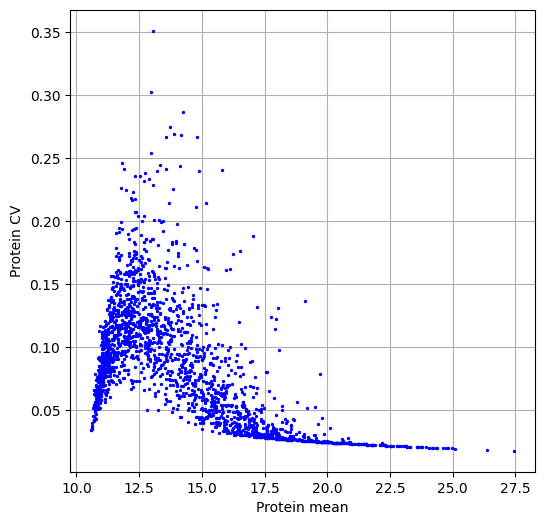

In [36]:
run_imputation_method(adata, "impute_sample_min", "sample min")

### KNN

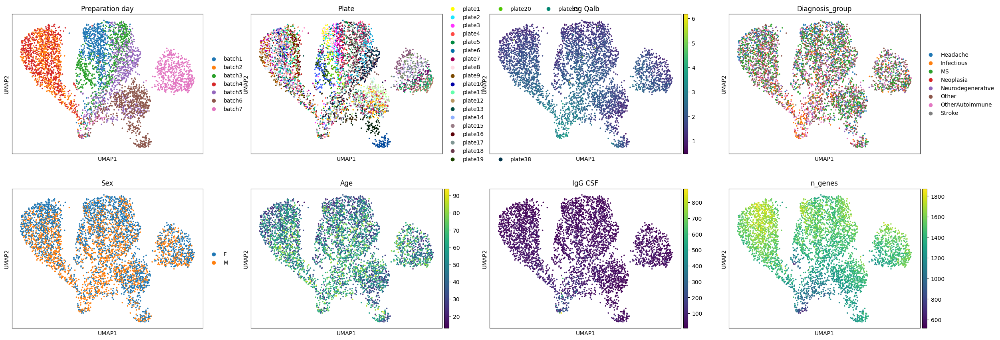

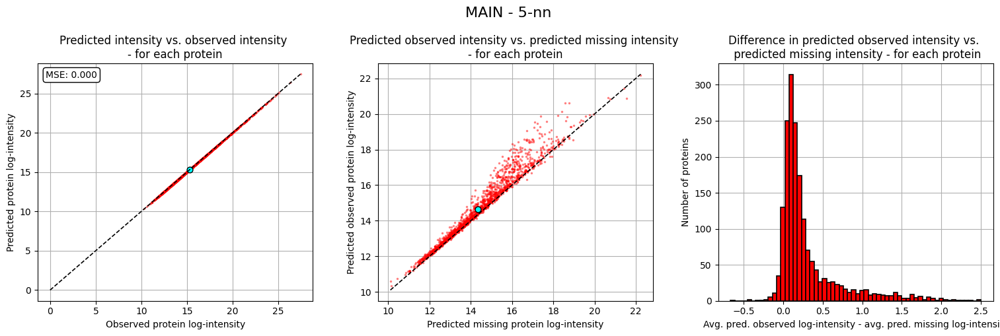

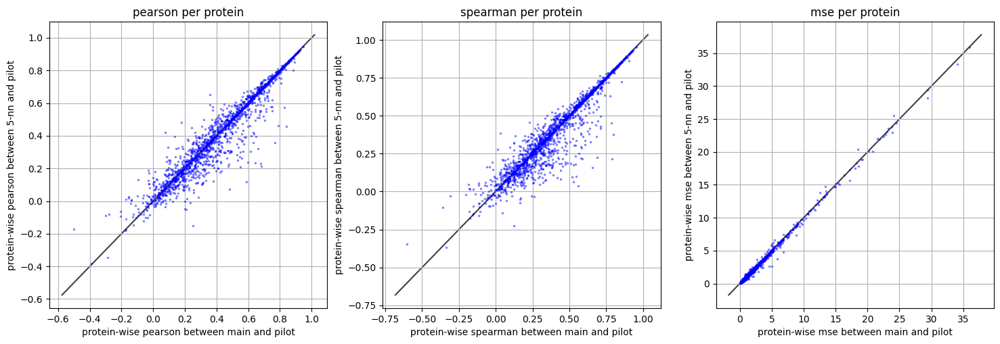

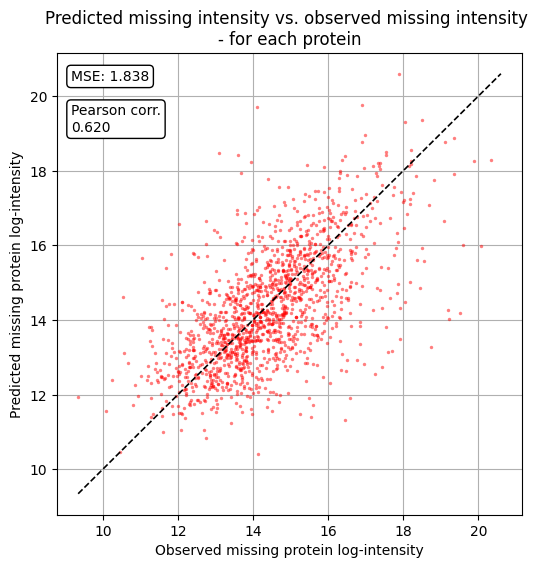

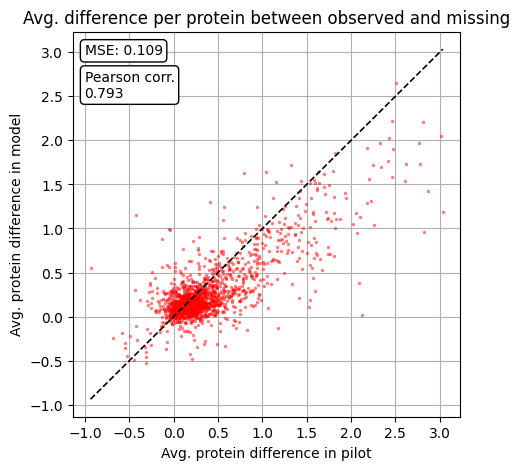

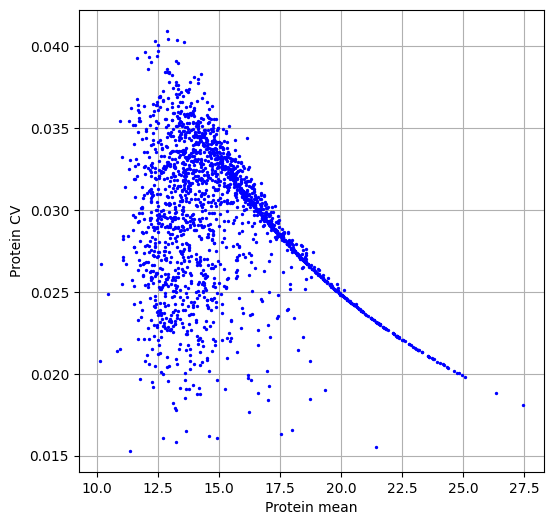

In [37]:
run_imputation_method(adata, "impute_knn", "5-nn", n_neighbors=5)

### Iterative

[IterativeImputer] Completing matrix with shape (4566, 2018)
[IterativeImputer] Ending imputation round 1/10, elapsed time 12.60
[IterativeImputer] Change: 21319.279884263808, scaled tolerance: 0.029340324331626803 
[IterativeImputer] Ending imputation round 2/10, elapsed time 26.24
[IterativeImputer] Change: 494.2231621788946, scaled tolerance: 0.029340324331626803 
[IterativeImputer] Ending imputation round 3/10, elapsed time 37.79
[IterativeImputer] Change: 466.6283602820596, scaled tolerance: 0.029340324331626803 
[IterativeImputer] Ending imputation round 4/10, elapsed time 50.60
[IterativeImputer] Change: 469.53358486126376, scaled tolerance: 0.029340324331626803 
[IterativeImputer] Ending imputation round 5/10, elapsed time 60.97
[IterativeImputer] Change: 447.39671565529, scaled tolerance: 0.029340324331626803 
[IterativeImputer] Ending imputation round 6/10, elapsed time 73.13
[IterativeImputer] Change: 458.8798787378388, scaled tolerance: 0.029340324331626803 
[IterativeImput

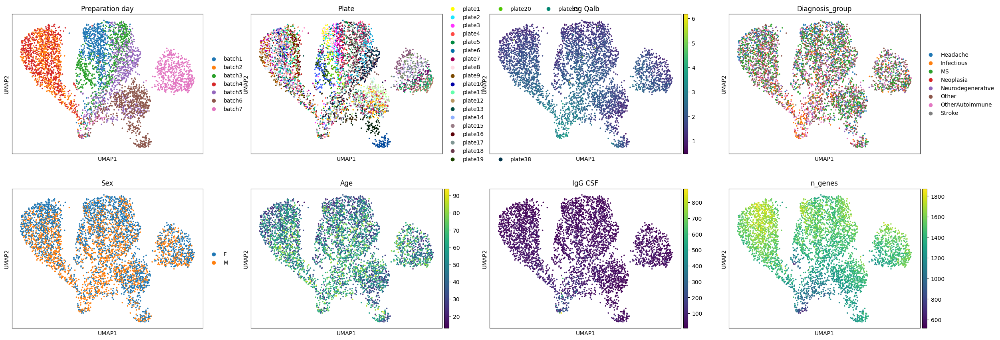

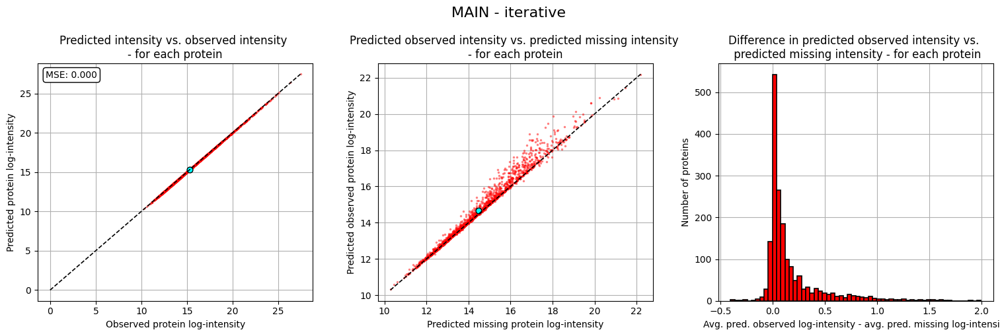

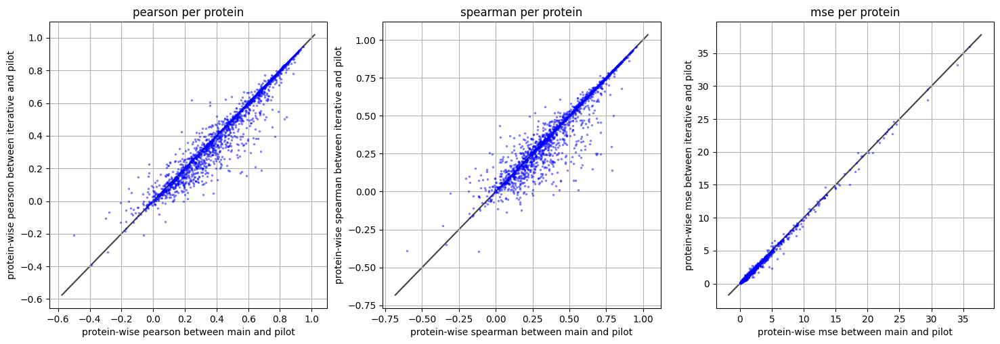

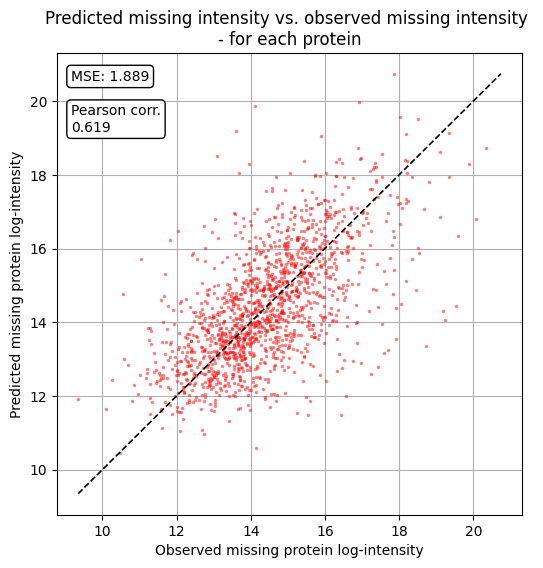

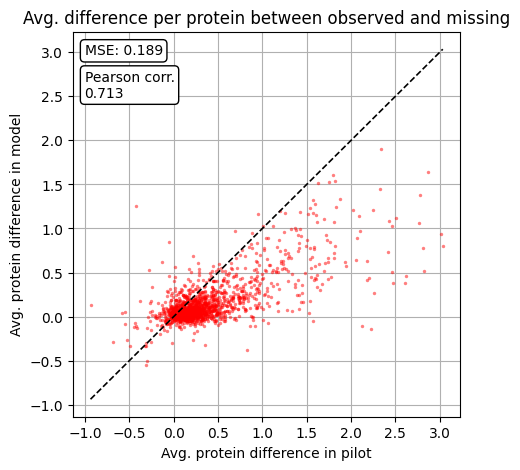

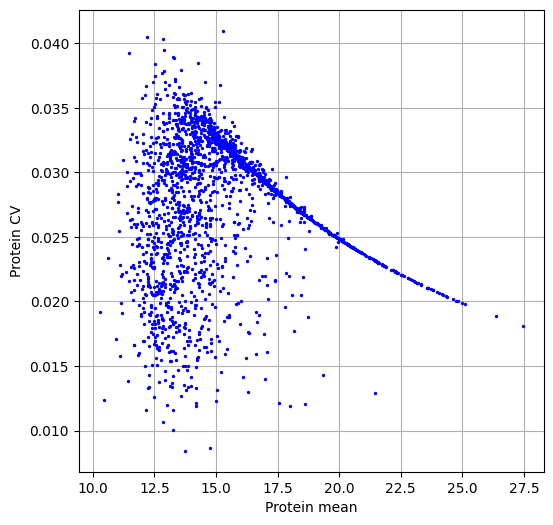

In [38]:
run_imputation_method(adata, "impute_iterative", "iterative")

## Mask-and-impute experiments

In [2]:
mnar_proportions = [0, 0.25, 0.5, 0.75, 1]

seed = 42

### KNN

In [8]:
def run_imputation_method2(adata, method_fn_name, mnar_proportion, seed, model_name=None, **fn_kwargs):
    m_mnar, m_mcar = sm.create_mnar_mcar_mask(mv_rate=0.08, mnar_proportion=mnar_proportion, x=adata.layers["main"], seed=seed, sd_scale=5)
    print(f"MNAR: {np.sum(m_mnar) / m_mnar.size:.3f}, MCAR: {np.sum(m_mcar) / m_mcar.size:.3f}")

    train_mask = ~(m_mcar | m_mnar)
    sm.add_train_test_set(adata, train_mask, layer="main")

    fn = globals()[method_fn_name]
    adata.X = fn(adata, layer="train", **fn_kwargs)

    x_test = adata.layers["test"]

    m = (m_mcar | m_mnar) & ~np.isnan(adata.layers["main"])
    ok_cols = np.any(m, axis=0).reshape(1, -1)
    ok_cols = np.repeat(ok_cols, adata.shape[0], axis=0)
    f = ok_cols & ~np.isnan(x_test)

    x_guess = adata.X.copy()[f]
    x_true = x_test[f]

    ok = ~np.isnan(x_guess)
    x_guess = x_guess[ok]
    x_true = x_true[ok]  

    mse_test = metrics.mse(x_guess, x_true)

    print(f"Test MSE (individual): {mse_test:.4f}")

    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    v_min = np.min([np.nanmin(x_true), np.nanmin(x_guess)])
    v_max = np.max([np.nanmax(x_true), np.nanmax(x_guess)])

    ax.plot([v_min, v_max], [v_min, v_max], ls="--", c="black")
    ax.scatter(x_true, x_guess, s=1, alpha=0.1)
    ax.set_xlabel("True expression")
    ax.set_ylabel("Imputed expression")
    ax.set_title(f"Imputation accuracy (MSE: {mse_test:.4f})")
    ax.grid(True)
    fig.show()

    x_guess_means = np.nanmean(x_guess, axis=0)
    x_true_means = np.nanmean(x_true, axis=0)

    mse_test_agg = np.nanmean(x_guess_means - x_true_means)**2

    print(f"Test MSE (aggregate): {mse_test_agg:.4f}")

    model = method_fn_name if model_name is None else model_name

    res = {
        "model": model,
        "mnar_proportion": mnar_proportion,
        "mse_test": mse_test,
        "mse_test_agg": mse_test_agg
    }

    #PATH = "../../results/manns_lab_data/mai"

    #sup.save_dict_to_results(res, f"{model}_{mnar_proportion}.pkl", PATH)

In [10]:
adata = sc.read_h5ad("../../data/processed/manns_inhouse.h5ad")

In [5]:
adata = adata[np.random.choice(adata.n_obs, 2000, replace=False), :].copy()

MNAR: 0.000, MCAR: 0.080
Test MSE (individual): 0.1812
Test MSE (aggregate): 0.0002
MNAR: 0.134, MCAR: 0.061
Test MSE (individual): 0.2002
Test MSE (aggregate): 0.0021
MNAR: 0.134, MCAR: 0.042
Test MSE (individual): 0.2014
Test MSE (aggregate): 0.0024
MNAR: 0.134, MCAR: 0.021
Test MSE (individual): 0.2030
Test MSE (aggregate): 0.0026
MNAR: 0.134, MCAR: 0.000
Test MSE (individual): 0.2047
Test MSE (aggregate): 0.0029


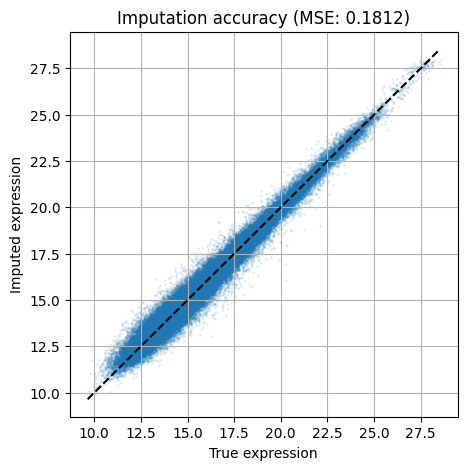

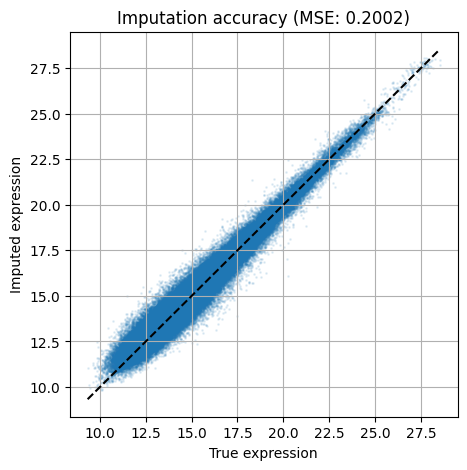

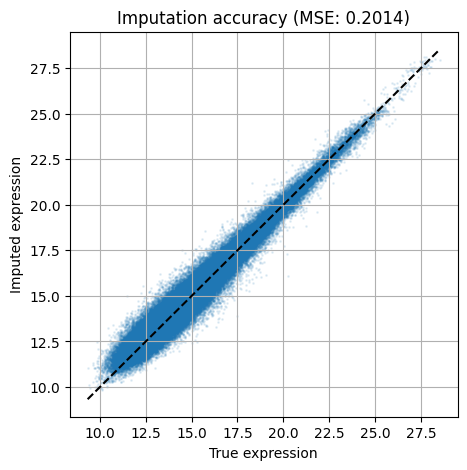

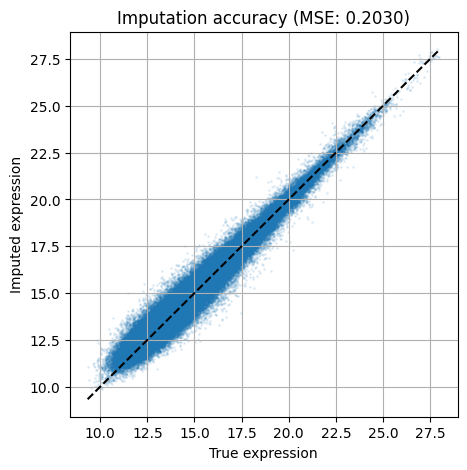

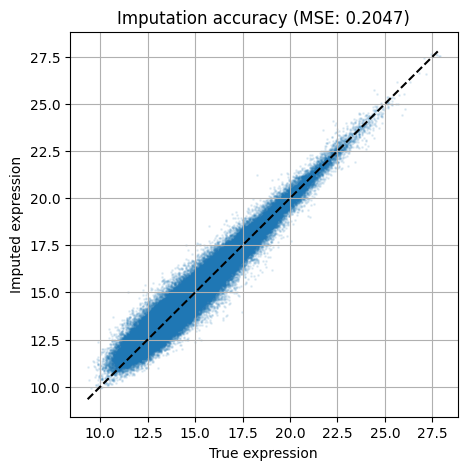

In [9]:
for mnar_proportion in mnar_proportions:
    run_imputation_method2(adata, "impute_knn", mnar_proportion=mnar_proportion, seed=seed, model_name="5-nn")

In [ ]:
for mnar_proportion in mnar_proportions:
    run_imputation_method2(adata, "impute_downshifted_normal_local", mnar_proportion=mnar_proportion, model_name="downshift local", seed=seed)

In [6]:
adata = sc.read_h5ad("../../data/processed/manns_inhouse.h5ad")

In [7]:
from scp.benchmark_models import run_protDP

In [13]:
for mnar_proportion in mnar_proportions:
    m_mnar, m_mcar = sm.create_mnar_mcar_mask(mv_rate=0.08, mnar_proportion=mnar_proportion, x=adata.layers["main"], seed=seed)
    print(f"MNAR: {np.sum(m_mnar) / m_mnar.size:.3f}, MCAR: {np.sum(m_mcar) / m_mcar.size:.3f}")

    train_mask = ~(m_mcar | m_mnar)
    sm.add_train_test_set(adata, train_mask, layer="main")

    result = run_protDP(adata, layer="main")

    x_test = adata.layers["test"]
    x_true = x_test[~np.isnan(x_test)]
    x_true_means = np.nanmean(x_true, axis=0)

    x_guess_means = result["mu_mis"]

    mse_test_agg = np.nanmean(x_guess_means - x_true_means)**2

    print(f"Test MSE (aggregate): {mse_test_agg:.4f}")

    model = "protDP"

    res = {
        "model": model,
        "mnar_proportion": mnar_proportion,
        "mse_test_agg": mse_test_agg
    }

    #PATH = "../../results/manns_lab_data/mai"

    #sup.save_dict_to_results(res, f"{model}_{mnar_proportion}.pkl", PATH)

MNAR: 0.000, MCAR: 0.080
Test MSE (aggregate): 0.3795
MNAR: 0.010, MCAR: 0.061
Test MSE (aggregate): 0.0323
MNAR: 0.021, MCAR: 0.042
Test MSE (aggregate): 0.0290
MNAR: 0.031, MCAR: 0.021
Test MSE (aggregate): 0.2437
MNAR: 0.041, MCAR: 0.000
Test MSE (aggregate): 0.6423
